In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd
import umap.umap_ as umap

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from scipy.stats import gaussian_kde

In [2]:
aggregated_latent = pd.read_csv('/mnt/iribhm/ai/test-data/aggregated_latent_space/0.49__tenpercent_resnet18.ckpt/aggregated_latent.csv')
aggregated_latent 
#GTEX-1269C-0226.svs

,tile_name,source,index,2,3,4,5,6,7,8,...,504,505,506,507,508,509,510,511,512,513
0,tile_108_33.png,GTEX-12696-0326.svs,GTEX-12696-0326.svs__tile_108_33.png,0.269482,0.215358,0.413017,0.274799,0.272798,0.254740,0.281015,...,0.242128,0.255501,0.264769,0.317512,0.232338,0.232933,0.224974,0.270629,0.368397,0.222645
1,tile_108_34.png,GTEX-12696-0326.svs,GTEX-12696-0326.svs__tile_108_34.png,0.267038,0.228965,0.407879,0.287812,0.248184,0.240461,0.289276,...,0.278606,0.255908,0.258575,0.288359,0.273968,0.238546,0.249932,0.245542,0.360483,0.234411
2,tile_108_35.png,GTEX-12696-0326.svs,GTEX-12696-0326.svs__tile_108_35.png,0.252260,0.254426,0.412026,0.293130,0.248046,0.285769,0.287050,...,0.278951,0.235819,0.260865,0.335124,0.258833,0.262655,0.233849,0.251019,0.355427,0.237603
3,tile_108_36.png,GTEX-12696-0326.svs,GTEX-12696-0326.svs__tile_108_36.png,0.268378,0.229685,0.389832,0.277108,0.267585,0.252068,0.295891,...,0.277680,0.233832,0.266378,0.322790,0.273852,0.248453,0.268391,0.249231,0.338474,0.258144
4,tile_109_30.png,GTEX-12696-0326.svs,GTEX-12696-0326.svs__tile_109_30.png,0.243210,0.251161,0.429386,0.282932,0.238300,0.262808,0.275123,...,0.257833,0.265977,0.261433,0.308869,0.251155,0.257714,0.270640,0.250254,0.344743,0.243320
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30084,tile_89_60.png,GTEX-1269C-0226.svs,GTEX-1269C-0226.svs__tile_89_60.png,0.227641,0.209690,0.434437,0.294263,0.256071,0.264997,0.308993,...,0.250784,0.241644,0.270108,0.310237,0.256793,0.265725,0.267678,0.232879,0.341943,0.242087
30085,tile_89_61.png,GTEX-1269C-0226.svs,GTEX-1269C-0226.svs__tile_89_61.png,0.268075,0.201973,0.381592,0.274410,0.251934,0.242180,0.293764,...,0.252269,0.268352,0.278436,0.313182,0.257440,0.262528,0.254463,0.274285,0.347734,0.248133
30086,tile_96_97.png,GTEX-1269C-0226.svs,GTEX-1269C-0226.svs__tile_96_97.png,0.279519,0.231417,0.429834,0.295726,0.268533,0.259183,0.258164,...,0.253513,0.247983,0.251792,0.305123,0.289859,0.255991,0.267075,0.250351,0.340789,0.242102
30087,tile_96_98.png,GTEX-1269C-0226.svs,GTEX-1269C-0226.svs__tile_96_98.png,0.250993,0.228635,0.425998,0.309220,0.247221,0.270205,0.290453,...,0.256989,0.212361,0.292315,0.304340,0.267446,0.257791,0.250917,0.257765,0.325426,0.253577


In [3]:
gtex = pd.read_feather('/mnt/iribhm/people/zzhang/code/GTEx_cluster/893_tenpercent_resnet/data/combined_latent_space.feather',use_threads=True)
gtex

,tile,svs,0,1,2,3,4,5,6,7,...,502,503,504,505,506,507,508,509,510,511
0,tile_136_67.png,GTEX-14PJ5-0126.svs,0.262212,0.232713,0.446634,0.289785,0.280569,0.263332,0.284346,0.287800,...,0.275813,0.258043,0.247282,0.334450,0.272206,0.258005,0.257698,0.236505,0.347318,0.238229
1,tile_136_68.png,GTEX-14PJ5-0126.svs,0.248996,0.229136,0.428391,0.308953,0.262751,0.258749,0.283360,0.301256,...,0.249181,0.282550,0.256260,0.313570,0.289150,0.247020,0.245169,0.281645,0.373140,0.227311
2,tile_137_64.png,GTEX-14PJ5-0126.svs,0.258909,0.254476,0.409313,0.309787,0.258881,0.281560,0.310151,0.299984,...,0.275731,0.246344,0.263241,0.328862,0.264950,0.248523,0.232102,0.264293,0.339247,0.251052
3,tile_137_65.png,GTEX-14PJ5-0126.svs,0.252951,0.217063,0.399049,0.280784,0.265302,0.256842,0.290421,0.302517,...,0.253742,0.237733,0.254722,0.298400,0.260907,0.260999,0.277303,0.234660,0.331284,0.240113
4,tile_137_66.png,GTEX-14PJ5-0126.svs,0.262098,0.254438,0.428214,0.291008,0.256551,0.257810,0.295719,0.294800,...,0.253706,0.253538,0.251502,0.310953,0.255805,0.256775,0.225415,0.248087,0.316499,0.268066
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7079539,tile_99_65.png,GTEX-NL3G-1626.svs,0.241940,0.202516,0.415727,0.263516,0.244315,0.238815,0.280096,0.285939,...,0.259412,0.256777,0.270949,0.276229,0.259950,0.277112,0.234577,0.273227,0.340185,0.235333
7079540,tile_99_66.png,GTEX-NL3G-1626.svs,0.275815,0.233957,0.400462,0.303157,0.240953,0.259598,0.294040,0.270775,...,0.255496,0.234577,0.264027,0.296303,0.244845,0.234188,0.273280,0.273201,0.372846,0.241186
7079541,tile_99_67.png,GTEX-NL3G-1626.svs,0.259634,0.244343,0.417518,0.284054,0.248850,0.276117,0.280987,0.291401,...,0.246615,0.265461,0.278409,0.301758,0.254147,0.252325,0.257592,0.256417,0.337094,0.232538
7079542,tile_99_68.png,GTEX-NL3G-1626.svs,0.279658,0.223308,0.409220,0.286006,0.238083,0.237177,0.284540,0.255770,...,0.280057,0.253476,0.258578,0.321800,0.239835,0.243663,0.250071,0.263362,0.364031,0.219913


GTEX-1IOXB-1026 

GTEX-PWO3-1326 adipose tissue ? 

GTEX-1B8SG-1126 what is the more violet piece ? 

GTEX-YJ8A-0226 not sure but is it a fold ? 

GTEX-12WSD-0926 normal tissue benchmark ? 

GTEX-1CAMQ-1126 mini air bubble

GTEX-ZPCL-0126 what happened here ? 
GTEX-15SHU-0726 well dissected

In [ ]:
gtex['svs'].unique()

In [3]:
example = gtex.loc[1]
print(example['svs'])

GTEX-14PJ5-0126.svs


In [4]:
latent = gtex.loc[gtex['svs']=='GTEX-14PJ5-0126.svs']
latent = latent.drop(columns=['svs'])
latent = latent.sort_index()
latent.shape

(5814, 513)

In [5]:
latent.index = latent['tile']
latent.drop(columns=['tile'], inplace = True)
latent

,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
tile,,,,,,,,,,,,,,,,,,,,,
tile_136_67.png,0.262212,0.232713,0.446634,0.289785,0.280569,0.263332,0.284346,0.287800,0.279555,0.233327,...,0.275813,0.258043,0.247282,0.334450,0.272206,0.258005,0.257698,0.236505,0.347318,0.238229
tile_136_68.png,0.248996,0.229136,0.428391,0.308953,0.262751,0.258749,0.283360,0.301256,0.267298,0.225522,...,0.249181,0.282550,0.256260,0.313570,0.289150,0.247020,0.245169,0.281645,0.373140,0.227311
tile_137_64.png,0.258909,0.254476,0.409313,0.309787,0.258881,0.281560,0.310151,0.299984,0.258071,0.232793,...,0.275731,0.246344,0.263241,0.328862,0.264950,0.248523,0.232102,0.264293,0.339247,0.251052
tile_137_65.png,0.252951,0.217063,0.399049,0.280784,0.265302,0.256842,0.290421,0.302517,0.231505,0.238774,...,0.253742,0.237733,0.254722,0.298400,0.260907,0.260999,0.277303,0.234660,0.331284,0.240113
tile_137_66.png,0.262098,0.254438,0.428214,0.291008,0.256551,0.257810,0.295719,0.294800,0.275586,0.249059,...,0.253706,0.253538,0.251502,0.310953,0.255805,0.256775,0.225415,0.248087,0.316499,0.268066
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tile_82_96.png,0.241343,0.211587,0.451212,0.274354,0.241336,0.288291,0.291724,0.295337,0.238079,0.229909,...,0.261724,0.255102,0.255026,0.303621,0.296700,0.247633,0.248141,0.270482,0.364731,0.234302
tile_83_69.png,0.262312,0.229116,0.425720,0.267033,0.268260,0.240199,0.299436,0.286808,0.237277,0.251879,...,0.255013,0.251530,0.263391,0.291448,0.254649,0.249035,0.229169,0.269083,0.365215,0.236306
tile_83_70.png,0.234505,0.244577,0.411797,0.283527,0.240836,0.272303,0.293237,0.280983,0.260229,0.242037,...,0.242610,0.265959,0.237237,0.326559,0.254884,0.213834,0.254516,0.269799,0.360273,0.242693


In [6]:
reducer = umap.UMAP()
embedding = reducer.fit_transform(latent)
embedding.shape

(5814, 2)

Text(0.5, 1.0, 'GTEX-14PJ5-0126.svs')

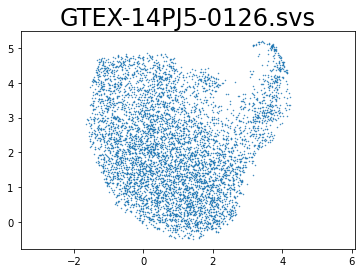

In [8]:
plt.scatter(
    embedding[:, 0],
    embedding[:, 1], s=0.2)
plt.gca().set_aspect('equal', 'datalim')
plt.title('GTEX-14PJ5-0126.svs', fontsize=24)

In [22]:
embedding

array([[-1.2436315,  3.819868 ],
       [ 3.418174 ,  2.4315472],
       [-1.0065007,  1.4900278],
       ...,
       [ 3.6625826,  2.576585 ],
       [ 3.8089383,  5.023698 ],
       [ 3.3368986,  2.9010296]], dtype=float32)

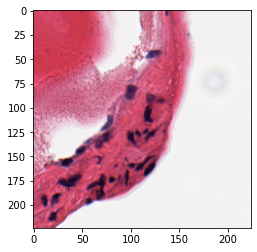

In [16]:
path = '/mnt/iribhm/GTEx/output/Thyroid/tiles/20X/0.49_'+ slide_name + '/processing/tiles/' + tile_name
im = plt.imread('/mnt/iribhm/GTEx/output/Thyroid/tiles/20X/0.49_GTEX-14PJ5-0126.svs/processing/tiles/tile_83_78.png')
plt.imshow(im)

In [ ]:
list(latent.index)


In [41]:
slide_name = 'GTEX-14PJ5-0126.svs'
paths = []
for i in range(latent.shape[0]):
    path = '/mnt/iribhm/GTEx/output/Thyroid/tiles/20X/0.49_'+ slide_name + '/processing/tiles/' + list(latent.index)[i]
    paths.append(path)

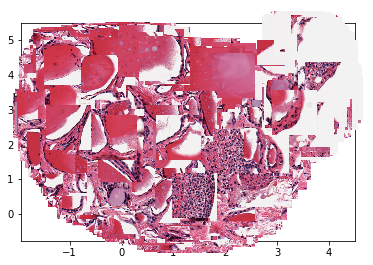

In [44]:
def getImage(path):
    return OffsetImage(plt.imread(path), zoom = 0.2)

x = embedding[:, 0]
y = embedding[:, 1]
fig, ax = plt.subplots()
ax.scatter(x, y) 

for x0, y0, path in zip(x, y,paths):
    ab = AnnotationBbox(getImage(path), (x0, y0), frameon=False)
    ax.add_artist(ab)

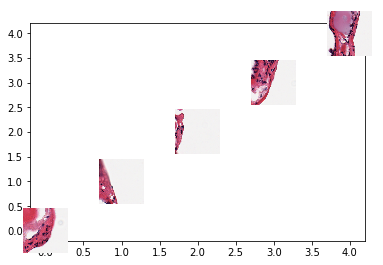

In [32]:
def getImage(path):
    return OffsetImage(plt.imread(path), zoom = 0.2)

paths = ['/mnt/iribhm/GTEx/output/Thyroid/tiles/20X/0.49_GTEX-14PJ5-0126.svs/processing/tiles/tile_83_78.png',
    '/mnt/iribhm/GTEx/output/Thyroid/tiles/20X/0.49_GTEX-14PJ5-0126.svs/processing/tiles/tile_82_87.png',
    '/mnt/iribhm/GTEx/output/Thyroid/tiles/20X/0.49_GTEX-14PJ5-0126.svs/processing/tiles/tile_82_86.png',
    '/mnt/iribhm/GTEx/output/Thyroid/tiles/20X/0.49_GTEX-14PJ5-0126.svs/processing/tiles/tile_82_85.png',
    '/mnt/iribhm/GTEx/output/Thyroid/tiles/20X/0.49_GTEX-14PJ5-0126.svs/processing/tiles/tile_82_84.png',
    '/mnt/iribhm/GTEx/output/Thyroid/tiles/20X/0.49_GTEX-14PJ5-0126.svs/processing/tiles/tile_82_83.png']

x = [0,1,2,3,4]
y = [0,1,2,3,4]

fig, ax = plt.subplots()
ax.scatter(x, y) 

for x0, y0, path in zip(x, y,paths):
    ab = AnnotationBbox(getImage(path), (x0, y0), frameon=False)
    ax.add_artist(ab)

In [9]:
latent_2 = gtex.loc[gtex['svs']=='GTEX-131YS-0726.svs']
latent_2 = latent_2.drop(columns=['svs'])
latent_2 = latent_2.sort_index()
latent_2.shape 

(5911, 513)

In [10]:
latent_2.index = latent_2['tile']
latent_2.drop(columns=['tile'], inplace = True)
latent_2

,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
tile,,,,,,,,,,,,,,,,,,,,,
tile_10_84.png,0.257777,0.245123,0.424492,0.292566,0.271134,0.257465,0.279062,0.282602,0.292127,0.223139,...,0.246264,0.244312,0.252771,0.302331,0.252066,0.242089,0.250133,0.236493,0.359484,0.239583
tile_10_85.png,0.256687,0.228679,0.410828,0.283696,0.268184,0.268342,0.297153,0.266750,0.267055,0.246079,...,0.261207,0.244696,0.264017,0.317908,0.255238,0.237035,0.236692,0.267017,0.368455,0.206356
tile_10_86.png,0.269677,0.238902,0.425704,0.282889,0.240989,0.268524,0.290862,0.297421,0.256299,0.240350,...,0.273026,0.251349,0.253714,0.319493,0.254890,0.240725,0.240366,0.262247,0.373186,0.240462
tile_10_87.png,0.268705,0.214515,0.419637,0.272878,0.223625,0.265766,0.304721,0.310211,0.259851,0.234914,...,0.255465,0.272218,0.254190,0.307538,0.276778,0.254624,0.236870,0.265406,0.380854,0.246305
tile_10_88.png,0.265890,0.251671,0.432641,0.281870,0.244990,0.277452,0.310379,0.304251,0.263498,0.228093,...,0.272594,0.235477,0.255618,0.298043,0.246414,0.211050,0.247683,0.258535,0.368254,0.228367
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tile_93_85.png,0.261440,0.254911,0.439933,0.278800,0.248534,0.247467,0.291235,0.313536,0.282609,0.228476,...,0.255718,0.242800,0.273920,0.332671,0.259999,0.248299,0.236759,0.249869,0.352668,0.249930
tile_93_86.png,0.256637,0.225984,0.438535,0.273307,0.249216,0.297333,0.285566,0.329487,0.262682,0.238498,...,0.251736,0.255992,0.249993,0.315012,0.255141,0.243846,0.246182,0.251656,0.362769,0.243903
tile_9_87.png,0.233788,0.254576,0.425957,0.263080,0.251502,0.276694,0.279321,0.316894,0.295655,0.248700,...,0.250576,0.228355,0.270911,0.302620,0.261422,0.236502,0.274331,0.293099,0.366091,0.237069


In [11]:
reducer = umap.UMAP()
embedding_2 = reducer.fit_transform(latent_2)
embedding_2.shape

(5911, 2)

Text(0.5, 1.0, 'GTEX-131YS-0726.svs')

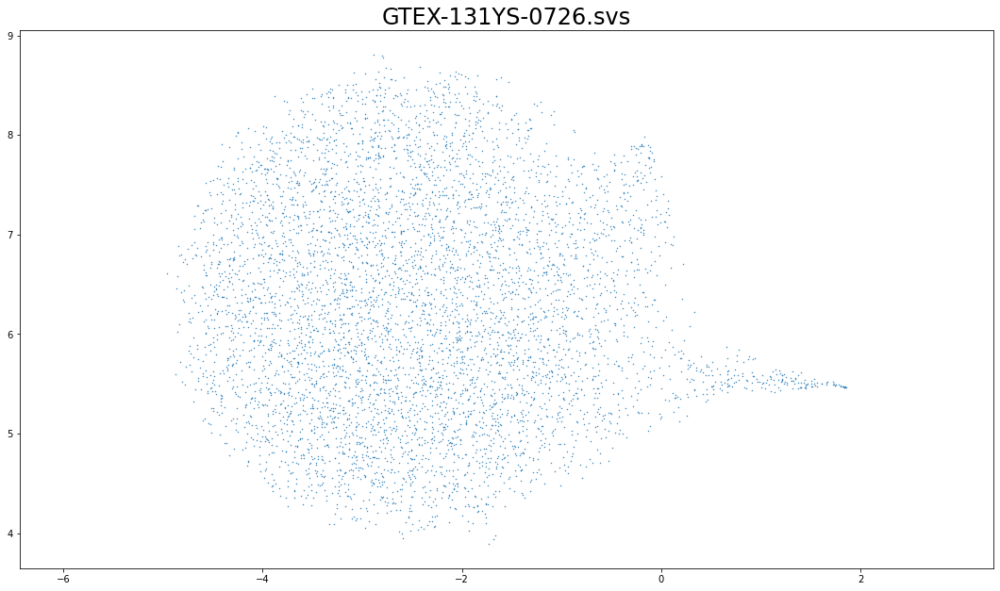

In [48]:
plt.figure(figsize =(18.5, 10.5)) 
plt.scatter(
    embedding_2[:, 0],
    embedding_2[:, 1], s=0.2)
plt.gca().set_aspect('equal', 'datalim')
plt.title('GTEX-131YS-0726.svs', fontsize=24)

In [46]:
slide_name_2 = 'GTEX-131YS-0726.svs'
paths_2 = []
for i in range(latent_2.shape[0]):
    path_2 = '/mnt/iribhm/GTEx/output/Thyroid/tiles/20X/0.49_'+ slide_name_2 + '/processing/tiles/' + list(latent_2.index)[i]
    paths_2.append(path_2)

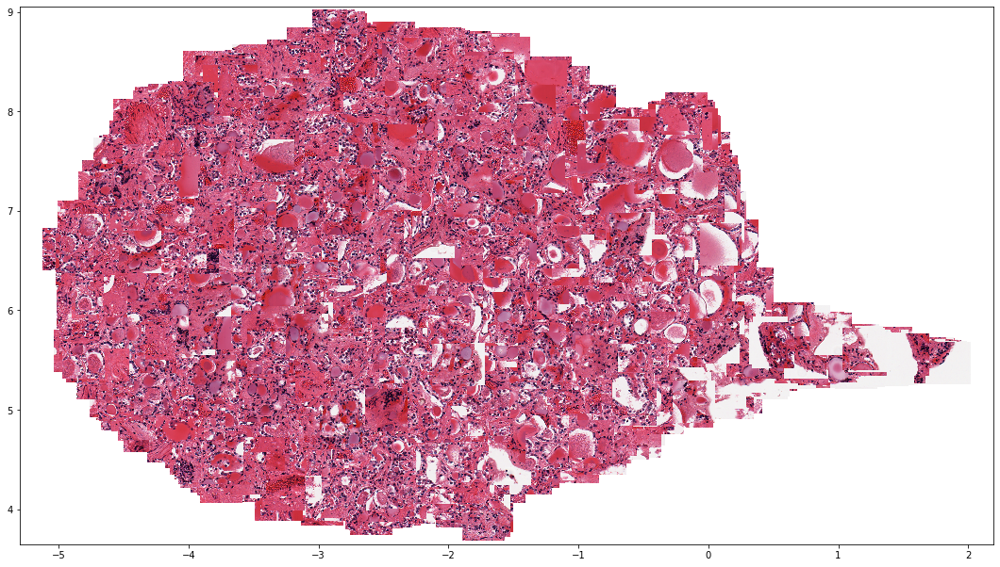

In [47]:
def getImage(path):
    return OffsetImage(plt.imread(path), zoom = 0.2)

x = embedding_2[:, 0]
y = embedding_2[:, 1]
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
ax.scatter(x, y) 
#fig = plt.figure(figsize =(7, 6)) 

for x0, y0, path in zip(x, y,paths_2):
    ab = AnnotationBbox(getImage(path), (x0, y0), frameon=False)
    ax.add_artist(ab)

## GTEX-SIU8-0626 muscle 

In [4]:
lat = gtex.loc[gtex['svs']=='GTEX-SIU8-0626.svs']
lat = lat.drop(columns=['svs'])
lat = lat.sort_index()
lat.shape 

(6719, 513)

In [5]:
lat.index = lat['tile']
lat.drop(columns=['tile'], inplace = True)
lat

,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
tile,,,,,,,,,,,,,,,,,,,,,
tile_111_90.png,0.246436,0.232798,0.427126,0.263543,0.246947,0.253403,0.280951,0.290734,0.291402,0.261740,...,0.250677,0.252720,0.276210,0.305936,0.246089,0.250560,0.253399,0.275877,0.361530,0.240623
tile_111_91.png,0.276541,0.211367,0.455136,0.308918,0.248756,0.262963,0.291620,0.277713,0.272852,0.247805,...,0.242484,0.253939,0.259393,0.307037,0.233509,0.270045,0.248799,0.276595,0.335824,0.237930
tile_111_92.png,0.249002,0.212802,0.398691,0.278937,0.257412,0.269774,0.285215,0.309672,0.270324,0.243124,...,0.274174,0.249961,0.262831,0.309642,0.264528,0.260132,0.258580,0.255100,0.327888,0.244302
tile_111_93.png,0.242884,0.234024,0.436243,0.281116,0.237404,0.271961,0.304598,0.297590,0.273915,0.231034,...,0.251364,0.239326,0.265253,0.325375,0.255685,0.223723,0.246465,0.280798,0.348807,0.251952
tile_111_94.png,0.265822,0.231889,0.435478,0.288448,0.256003,0.264659,0.307258,0.296234,0.293822,0.229917,...,0.272325,0.267914,0.262911,0.290682,0.239895,0.248483,0.265849,0.277168,0.366807,0.242166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tile_85_44.png,0.251439,0.225914,0.422759,0.276791,0.230565,0.266765,0.284184,0.298188,0.254076,0.253945,...,0.249202,0.255403,0.250138,0.313880,0.259924,0.262544,0.238221,0.258122,0.338518,0.227598
tile_85_45.png,0.281674,0.238248,0.383127,0.273767,0.258650,0.272661,0.298262,0.296759,0.264966,0.249876,...,0.234995,0.235556,0.282169,0.330593,0.265411,0.259068,0.228338,0.248621,0.377273,0.227542
tile_85_46.png,0.262060,0.240674,0.437255,0.295883,0.239329,0.262586,0.275814,0.290924,0.298399,0.247763,...,0.242256,0.252849,0.265771,0.325480,0.255269,0.255062,0.240442,0.255245,0.343011,0.243851


In [8]:
lat.to_csv('lat_GTEX-SIU8-0626.csv')

In [7]:
reducer = umap.UMAP()
embed = reducer.fit_transform(lat)
embed.shape

(6719, 2)

Text(0.5, 1.0, 'GTEX-SIU8-0626.svs')

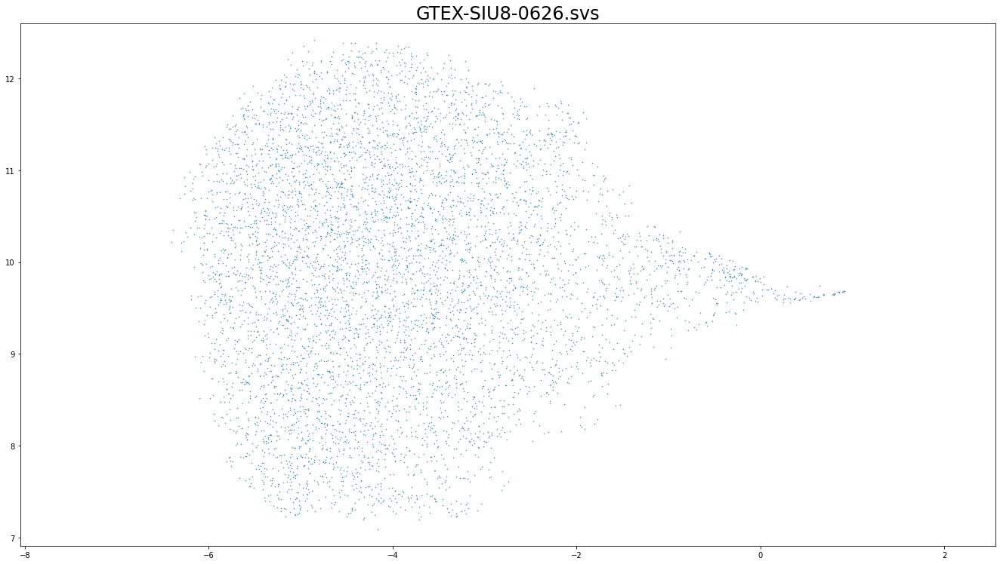

In [24]:
plt.figure(figsize =(18.5, 10.5)) 
#plt.rcParams["figure.figsize"] = [18.5, 10.5]
#plt.rcParams["figure.autolayout"] = True
plt.scatter(
    embed[:, 0],
    embed[:, 1], s=0.2)
plt.gca().set_aspect('equal', 'datalim')
plt.title('GTEX-SIU8-0626.svs', fontsize=24)

In [10]:
X = list(embed[:, 0])
Y = list(embed[:, 1])
print(type(X))
print(type(Y))

<class 'list'>
<class 'list'>


In [11]:
from babyplots import Babyplot

In [ ]:
bp = Babyplot(background_color="#ffffddff", turntable=True)
bp.add_plot(X, "shapeCloud", "categories",Y, {"colorScale": "Paired"})
bp
#Javascript Error: Can't find variable: define

In [35]:
from sklearn import decomposition
from sklearn import datasets

np.random.seed(5)

# load the data set
iris = datasets.load_iris()
X = iris.data
y = iris.target

# create the babyplots visualization
bp = Babyplot()
bp.add_plot(X.tolist(), "shapeCloud", "categories", y.tolist(), {"shape": "sphere",
                                                                 "colorScale": "Set2",
                                                                 "showAxes": [True, True, True],
                                                                 "axisLabels": ["PC 1", "PC 2", "PC 3"]})
# show the visualization
bp

<IPython.core.display.Javascript object>

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

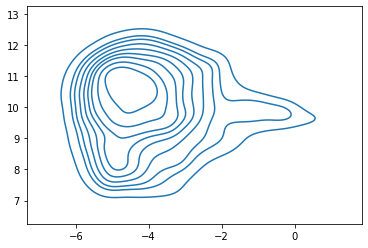

In [13]:
sns.kdeplot(embed[:, 0], embed[:, 1])

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:1676: UserWarning: `shade_lowest` is now deprecated in favor of `thresh`. Setting `thresh=0.05`, but please update your code.
  warnings.warn(msg, UserWarning)


<AxesSubplot:>

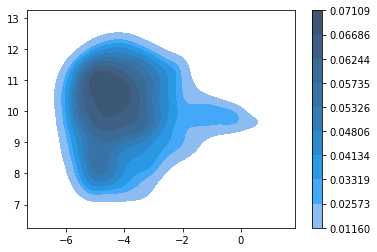

In [14]:
sns.kdeplot(embed[:, 0], embed[:, 1], shade = True, shade_lowest = False, cbar = True)

In [8]:
name = 'GTEX-SIU8-0626.svs'
paths_msc = []
for i in range(lat.shape[0]):
    path = '/mnt/iribhm/GTEx/output/Thyroid/tiles/20X/0.49_'+ name + '/processing/tiles/' + list(lat.index)[i]
    paths_msc.append(path)

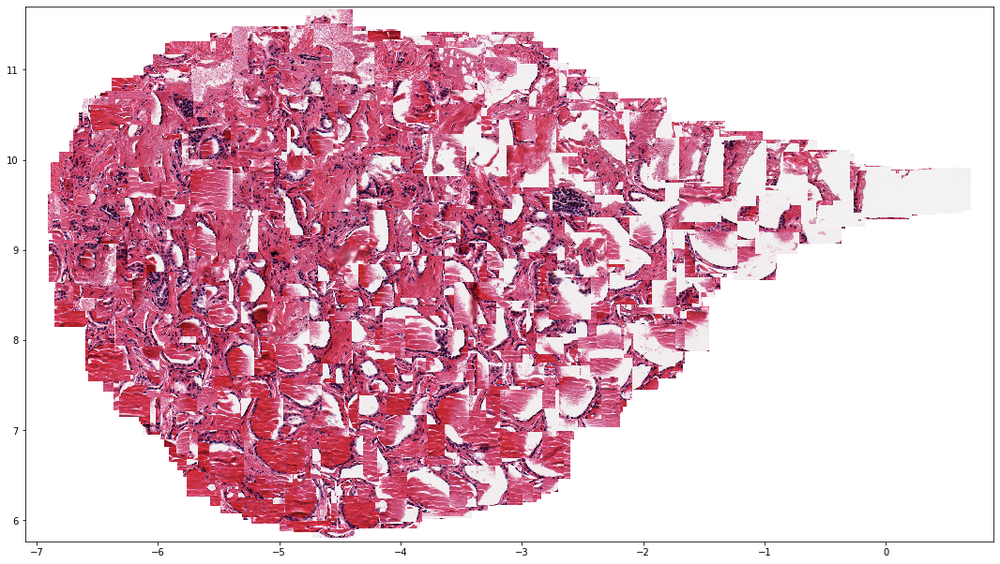

In [9]:
def getImage(path):
    return OffsetImage(plt.imread(path), zoom = 0.2)

x = embed[:, 0]
y = embed[:, 1]
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
ax.scatter(x, y) 
#fig = plt.figure(figsize =(7, 6)) 

for x0, y0, path in zip(x, y,paths_msc):
    ab = AnnotationBbox(getImage(path), (x0, y0), frameon=False)
    ax.add_artist(ab)

## GTEX-ZZPU-1326.svs

In [25]:
latent_3 = gtex.loc[gtex['svs']=='GTEX-ZZPU-1326.svs']
latent_3 = latent_3.drop(columns=['svs'])
latent_3 = latent_3.sort_index()
print(latent_3.shape)
latent_3.index = latent_3['tile']
latent_3.drop(columns=['tile'], inplace = True)
latent_3

(6270, 513)


,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
tile,,,,,,,,,,,,,,,,,,,,,
tile_161_26.png,0.259584,0.247259,0.430134,0.291183,0.251288,0.249999,0.285910,0.285411,0.289438,0.257553,...,0.257167,0.254603,0.249814,0.329282,0.259965,0.228234,0.257747,0.257895,0.337846,0.247567
tile_161_27.png,0.266349,0.227627,0.403521,0.291233,0.245691,0.250433,0.307632,0.308244,0.269533,0.234977,...,0.263972,0.246901,0.246158,0.322828,0.264073,0.238070,0.248042,0.254945,0.376500,0.224886
tile_161_28.png,0.255839,0.224110,0.439720,0.278388,0.247832,0.273007,0.288020,0.318263,0.241984,0.238958,...,0.254358,0.241055,0.250822,0.319848,0.241249,0.262823,0.254095,0.248270,0.375939,0.227748
tile_161_29.png,0.258054,0.219317,0.435235,0.287510,0.245903,0.255455,0.254584,0.263679,0.257461,0.231576,...,0.265276,0.275556,0.270714,0.331709,0.272028,0.226792,0.274191,0.253845,0.338461,0.243619
tile_161_34.png,0.252557,0.226370,0.424378,0.305088,0.238579,0.277791,0.296529,0.279705,0.259520,0.216338,...,0.247863,0.233401,0.267532,0.300364,0.257937,0.207686,0.260221,0.261628,0.324970,0.217893
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tile_88_96.png,0.247500,0.213215,0.437068,0.267174,0.254361,0.301518,0.286445,0.302095,0.268121,0.266417,...,0.247327,0.259249,0.264607,0.319185,0.252760,0.223109,0.236305,0.265628,0.349761,0.252136
tile_89_95.png,0.257066,0.224988,0.408326,0.265567,0.262565,0.278975,0.310976,0.266768,0.258160,0.235312,...,0.261563,0.247558,0.248290,0.327946,0.258958,0.233960,0.265662,0.274348,0.372893,0.258785
tile_88_95-checkpoint.png,0.267399,0.229170,0.440094,0.257254,0.255030,0.243909,0.292630,0.286521,0.276820,0.243809,...,0.260634,0.245394,0.262042,0.301500,0.253170,0.252952,0.253170,0.240258,0.367508,0.207760


In [35]:
latent_3 = latent_3.iloc[:-3,:]

In [26]:
reducer = umap.UMAP()
embedding_3 = reducer.fit_transform(latent_3)
embedding_3.shape

(6270, 2)

Text(0.5, 1.0, 'GTEX-ZZPU-1326.svs')

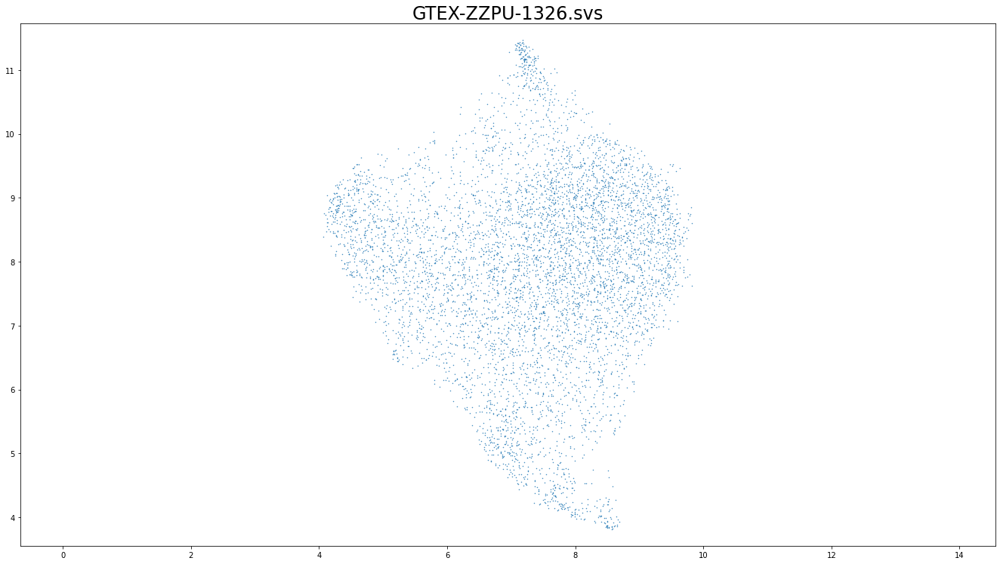

In [27]:
plt.scatter(
    embedding_3[:, 0],
    embedding_3[:, 1], s=0.2)
plt.gca().set_aspect('equal', 'datalim')
plt.title('GTEX-ZZPU-1326.svs', fontsize=24)

In [36]:
name = 'GTEX-ZZPU-1326.svs'
paths_3 = []
for i in range(latent_3.shape[0]):
    path = '/mnt/iribhm/GTEx/output/Thyroid/tiles/20X/0.49_'+ name + '/processing/tiles/' + list(latent_3.index)[i]
    paths_3.append(path)

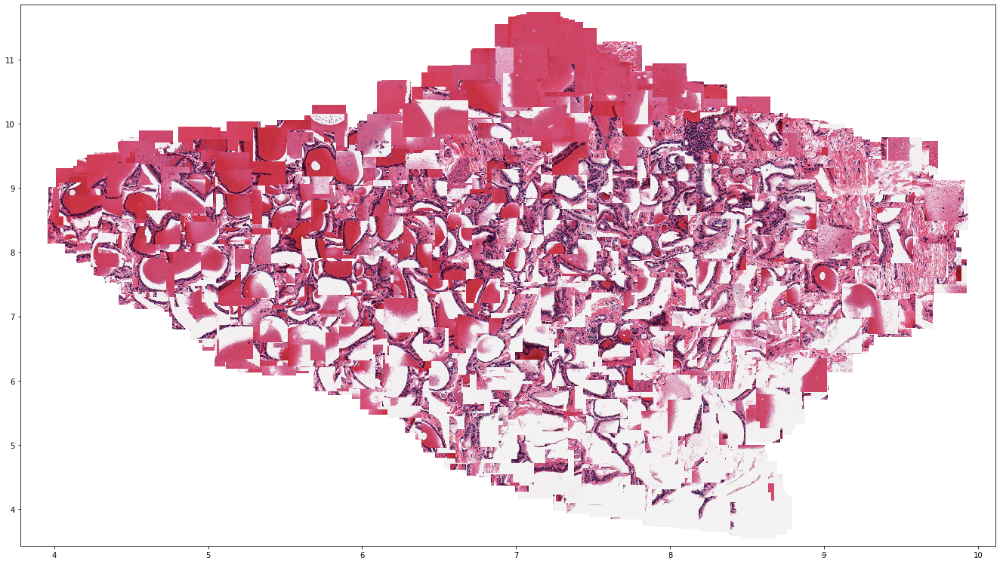

In [40]:
def getImage(path):
    return OffsetImage(plt.imread(path), zoom = 0.2)

x = embedding_3[:, 0]
y = embedding_3[:, 1]
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
ax.scatter(x, y) 
#fig = plt.figure(figsize =(7, 6)) 

for x0, y0, path in zip(x, y,paths_3):
    ab = AnnotationBbox(getImage(path), (x0, y0), frameon=False)
    ax.add_artist(ab)

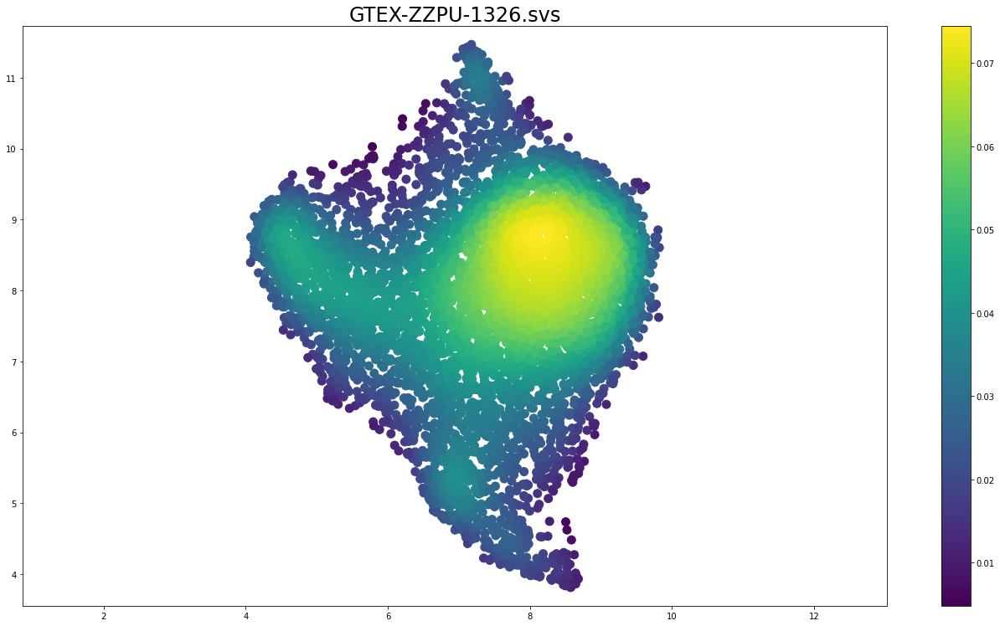

In [44]:
# Calculate the point density
xy = np.vstack([embedding_3[:, 0],embedding_3[:, 1]])
z = gaussian_kde(xy)(xy)

fig, ax = plt.subplots()
sc = ax.scatter(embedding_3[:, 0],embedding_3[:, 1],c=z, s=100)
plt.colorbar(sc)
plt.gca().set_aspect('equal', 'datalim')
plt.title('GTEX-ZZPU-1326.svs', fontsize=24)
plt.show()


## GTEX-12696-0326

In [4]:
lat_12696 = pd.read_csv('/mnt/iribhm/ai/test-data/results/0.49/tenpercent_resnet18.ckpt/GTEX-12696-0326.svs/_repLattenpercent_resnet18.ckpt.csv', header = None)
#there is a problem here there are only 2-513 columns of embedding or 511 one in missing ??

In [22]:
lat_12696

,0,1,2,3,4,5,6,7,8,9,...,504,505,506,507,508,509,510,511,512,513
0,tile_108_33.png,GTEX-12696-0326.svs,0.269482,0.215358,0.413017,0.274799,0.272798,0.254740,0.281015,0.305770,...,0.242128,0.255501,0.264769,0.317512,0.232338,0.232933,0.224974,0.270629,0.368397,0.222645
1,tile_108_34.png,GTEX-12696-0326.svs,0.267038,0.228965,0.407879,0.287812,0.248184,0.240461,0.289276,0.260846,...,0.278606,0.255908,0.258575,0.288359,0.273968,0.238546,0.249932,0.245542,0.360483,0.234411
2,tile_108_35.png,GTEX-12696-0326.svs,0.252260,0.254426,0.412026,0.293130,0.248046,0.285769,0.287050,0.294326,...,0.278951,0.235819,0.260865,0.335124,0.258833,0.262655,0.233849,0.251019,0.355427,0.237603
3,tile_108_36.png,GTEX-12696-0326.svs,0.268378,0.229685,0.389832,0.277108,0.267585,0.252068,0.295891,0.318839,...,0.277680,0.233832,0.266378,0.322790,0.273852,0.248453,0.268391,0.249231,0.338474,0.258144
4,tile_109_30.png,GTEX-12696-0326.svs,0.243210,0.251161,0.429386,0.282932,0.238300,0.262808,0.275123,0.283013,...,0.257833,0.265977,0.261433,0.308869,0.251155,0.257714,0.270640,0.250254,0.344743,0.243320
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7633,tile_9_95.png,GTEX-12696-0326.svs,0.259422,0.239397,0.422742,0.293068,0.249087,0.274919,0.303793,0.290818,...,0.272416,0.251733,0.253178,0.270735,0.264353,0.267639,0.228529,0.253209,0.359384,0.236661
7634,tile_9_96.png,GTEX-12696-0326.svs,0.274967,0.205826,0.405288,0.281601,0.268183,0.277921,0.297297,0.298062,...,0.248392,0.245435,0.268608,0.303849,0.239105,0.247726,0.240693,0.230405,0.342886,0.243802
7635,tile_9_97.png,GTEX-12696-0326.svs,0.262885,0.264356,0.432698,0.309483,0.240510,0.260430,0.274055,0.310510,...,0.255300,0.240291,0.269024,0.317404,0.261575,0.270301,0.239405,0.247581,0.331131,0.254054
7636,tile_9_98.png,GTEX-12696-0326.svs,0.276413,0.241660,0.414954,0.289305,0.270603,0.248720,0.259249,0.310692,...,0.250538,0.250923,0.275060,0.289511,0.249462,0.244962,0.243129,0.255927,0.344203,0.243390


In [5]:
lat_12696.index = lat_12696[0]
lat_12696.drop(columns=[0,1], inplace = True)
lat_12696

,2,3,4,5,6,7,8,9,10,11,...,504,505,506,507,508,509,510,511,512,513
0,,,,,,,,,,,,,,,,,,,,,
tile_108_33.png,0.269482,0.215358,0.413017,0.274799,0.272798,0.254740,0.281015,0.305770,0.274670,0.234330,...,0.242128,0.255501,0.264769,0.317512,0.232338,0.232933,0.224974,0.270629,0.368397,0.222645
tile_108_34.png,0.267038,0.228965,0.407879,0.287812,0.248184,0.240461,0.289276,0.260846,0.279278,0.239059,...,0.278606,0.255908,0.258575,0.288359,0.273968,0.238546,0.249932,0.245542,0.360483,0.234411
tile_108_35.png,0.252260,0.254426,0.412026,0.293130,0.248046,0.285769,0.287050,0.294326,0.262382,0.237799,...,0.278951,0.235819,0.260865,0.335124,0.258833,0.262655,0.233849,0.251019,0.355427,0.237603
tile_108_36.png,0.268378,0.229685,0.389832,0.277108,0.267585,0.252068,0.295891,0.318839,0.284885,0.222819,...,0.277680,0.233832,0.266378,0.322790,0.273852,0.248453,0.268391,0.249231,0.338474,0.258144
tile_109_30.png,0.243210,0.251161,0.429386,0.282932,0.238300,0.262808,0.275123,0.283013,0.259317,0.247514,...,0.257833,0.265977,0.261433,0.308869,0.251155,0.257714,0.270640,0.250254,0.344743,0.243320
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tile_9_95.png,0.259422,0.239397,0.422742,0.293068,0.249087,0.274919,0.303793,0.290818,0.267678,0.232882,...,0.272416,0.251733,0.253178,0.270735,0.264353,0.267639,0.228529,0.253209,0.359384,0.236661
tile_9_96.png,0.274967,0.205826,0.405288,0.281601,0.268183,0.277921,0.297297,0.298062,0.270961,0.238684,...,0.248392,0.245435,0.268608,0.303849,0.239105,0.247726,0.240693,0.230405,0.342886,0.243802
tile_9_97.png,0.262885,0.264356,0.432698,0.309483,0.240510,0.260430,0.274055,0.310510,0.282821,0.233723,...,0.255300,0.240291,0.269024,0.317404,0.261575,0.270301,0.239405,0.247581,0.331131,0.254054


In [6]:
reducer = umap.UMAP()
embed_12696 = reducer.fit_transform(lat_12696)
embed_12696.shape

(7638, 2)

Text(0.5, 1.0, 'GTEX-12696-0326.svs')

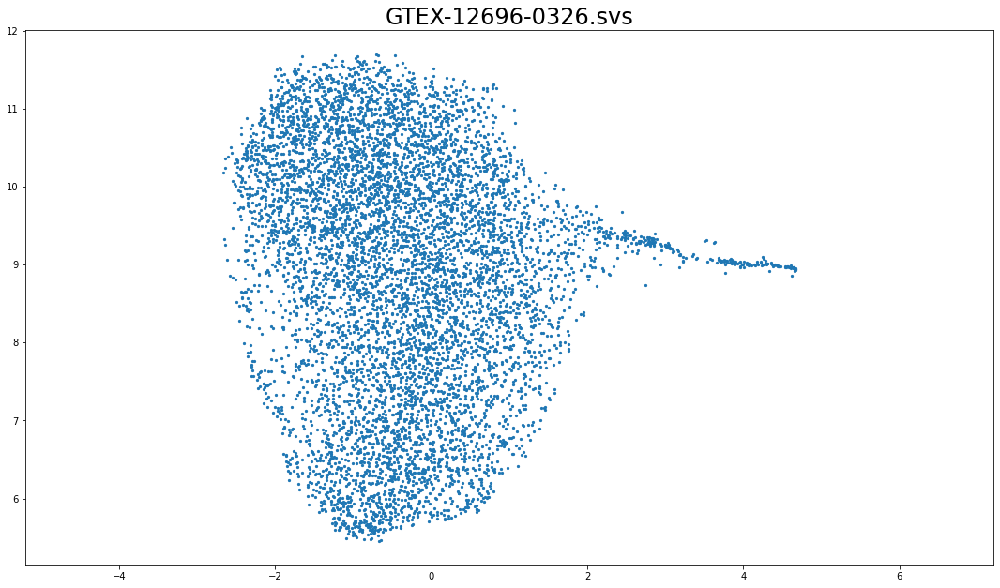

In [26]:
plt.figure(figsize =(18.5, 10.5)) 
plt.scatter(
    embed_12696[:, 0],
    embed_12696[:, 1], s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.title('GTEX-12696-0326.svs', fontsize=24)

In [7]:
name = 'GTEX-12696-0326.svs'
paths = []
for i in range(lat_12696.shape[0]):
    path = '/mnt/iribhm/GTEx/output/Thyroid/tiles/20X/0.49_'+ name + '/processing/tiles/' + list(lat_12696.index)[i]
    paths.append(path)

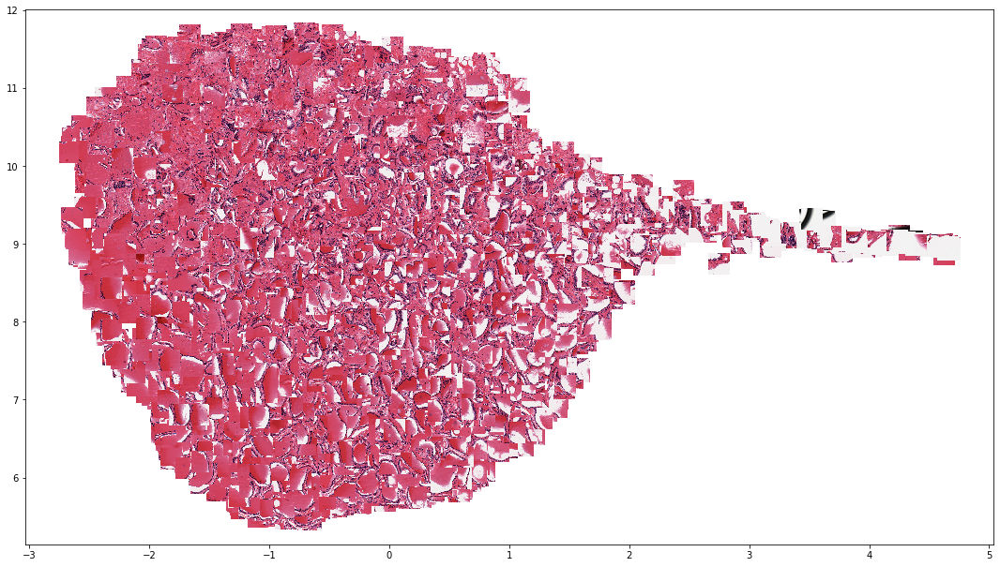

In [28]:
def getImage(path):
    return OffsetImage(plt.imread(path), zoom = 0.1)

x = embed_12696[:, 0]
y = embed_12696[:, 1]
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
ax.scatter(x, y) 
#fig = plt.figure(figsize =(7, 6)) 

for x0, y0, path in zip(x, y,paths):
    ab = AnnotationBbox(getImage(path), (x0, y0), frameon=False)
    ax.add_artist(ab)

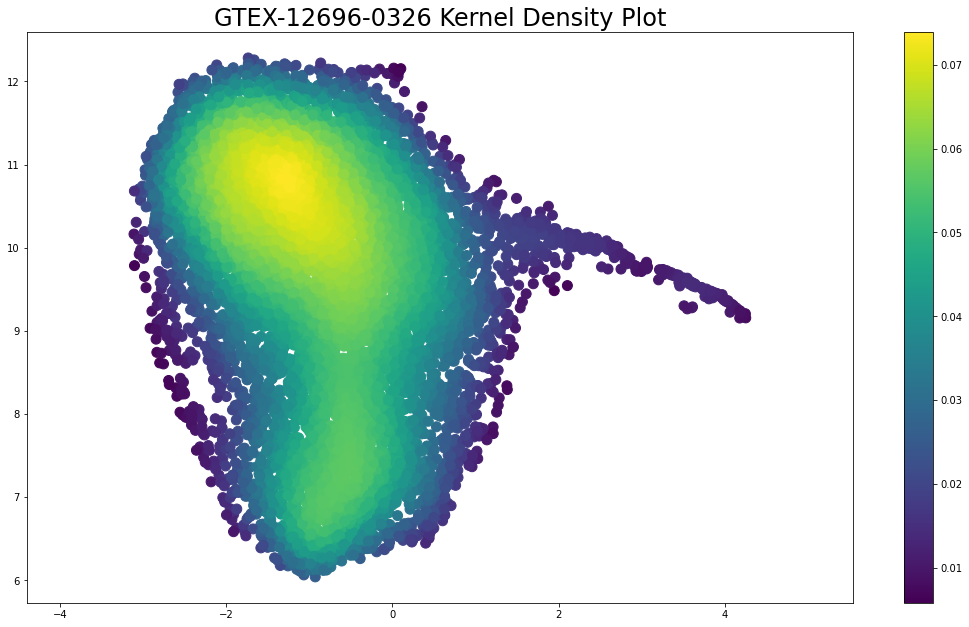

In [16]:
# Calculate the point density
xy = np.vstack([embed_12696[:, 0],embed_12696[:, 1]])
z = gaussian_kde(xy)(xy) #density 

fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5)
sc = ax.scatter(embed_12696[:, 0],embed_12696[:, 1],c=z, s=100)
plt.colorbar(sc)
plt.gca().set_aspect('equal', 'datalim')
plt.title('GTEX-12696-0326 Kernel Density Plot', fontsize=24)
plt.show()

In [12]:
embed_12696

array([[-2.130447  , 10.951967  ],
       [-0.34507033, 10.677724  ],
       [-1.4033204 , 10.840588  ],
       ...,
       [-2.0563338 , 10.874477  ],
       [-1.818227  , 10.245001  ],
       [-1.4796828 , 11.656761  ]], dtype=float32)

In [17]:
#tile X Y density
density_df = pd.DataFrame()
density_df['tile'] = pd.Series(lat_12696.index)

density_df.index = density_df['tile']
density_df.drop(columns=['tile'], inplace = True)

density_df['X'] = embed_12696[:, 0]
density_df['Y'] = embed_12696[:, 1]

#xy = np.vstack([embed_12696[:, 0],embed_12696[:, 1]])
#z = gaussian_kde(xy)(xy)
density_df['density'] = z
density_df 

,X,Y,density
tile,,,
tile_108_33.png,-2.130447,10.951967,0.063649
tile_108_34.png,-0.345070,10.677724,0.060160
tile_108_35.png,-1.403320,10.840588,0.073422
tile_108_36.png,0.756163,7.696537,0.022231
tile_109_30.png,2.479270,10.012953,0.015747
...,...,...,...
tile_9_95.png,-0.813062,11.354012,0.059427
tile_9_96.png,-1.744806,11.630873,0.058509
tile_9_97.png,-2.056334,10.874477,0.065024


In [23]:
low = density_df.loc[density_df['density'] <= 0.01]
low = low.sort_values(by='X')
low

,X,Y,density
tile,,,
tile_123_47.png,-3.107335,10.164875,0.009542
tile_160_66.png,-3.101559,9.785973,0.006214
tile_131_35.png,-3.044705,9.924820,0.009281
tile_55_76.png,-2.981307,9.655244,0.008801
tile_56_52.png,-2.962655,9.520483,0.008414
...,...,...,...
tile_69_139.png,4.222481,9.196310,0.008326
tile_63_143.png,4.225929,9.198272,0.008279
tile_60_146.png,4.229898,9.184756,0.008144


In [26]:
name = 'GTEX-12696-0326.svs'
paths = []
for i in range(len(low)):
    path = '/mnt/iribhm/GTEx/output/Thyroid/tiles/20X/0.49_'+ name + '/processing/tiles/' + list(low.index)[i]
    paths.append(path)

In [ ]:
def show_img(files):
    plt.figure(figsize= (10,10))
    ind = np.random.randint(0, len(files), 25)
    i=0
    for loc in ind:
        plt.subplot(5,5,i+1)
        sample = load_img(files[loc], target_size=(150,150))
        sample = img_to_array(sample)
        plt.axis("off")
        plt.imshow(sample.astype("uint8"))
        plt.savefig('results/someimages_3.png',transparent=True)
        i+=1

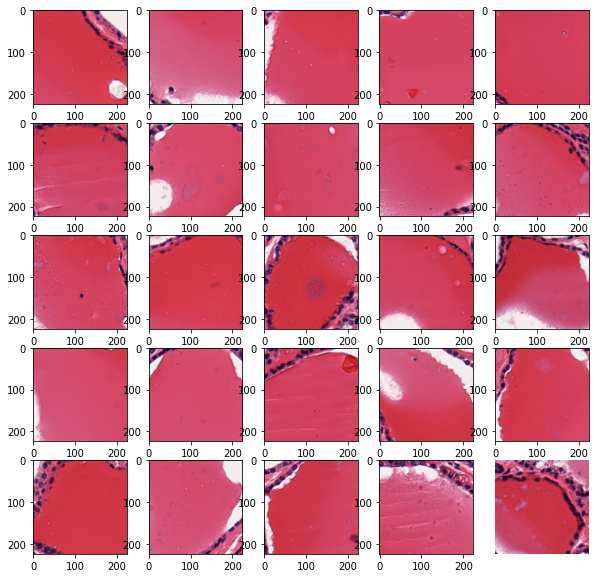

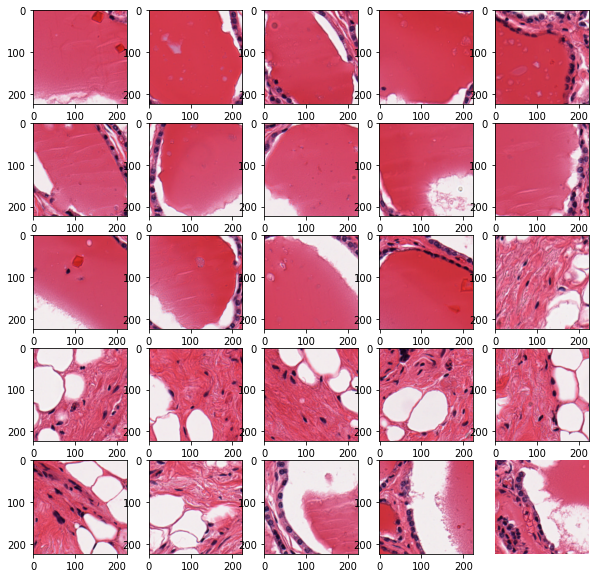

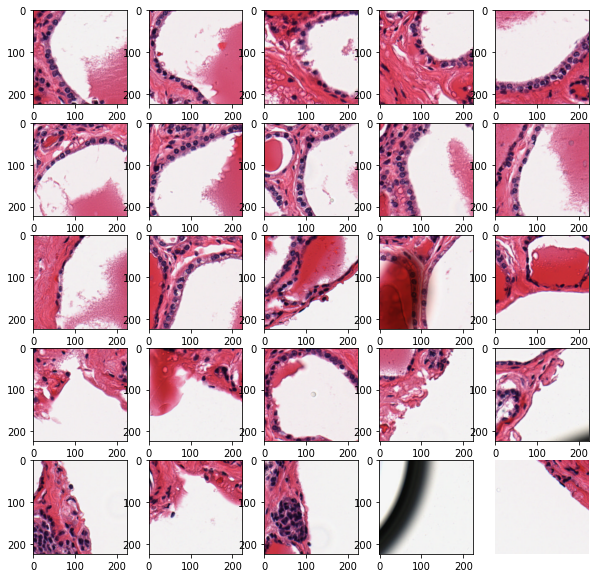

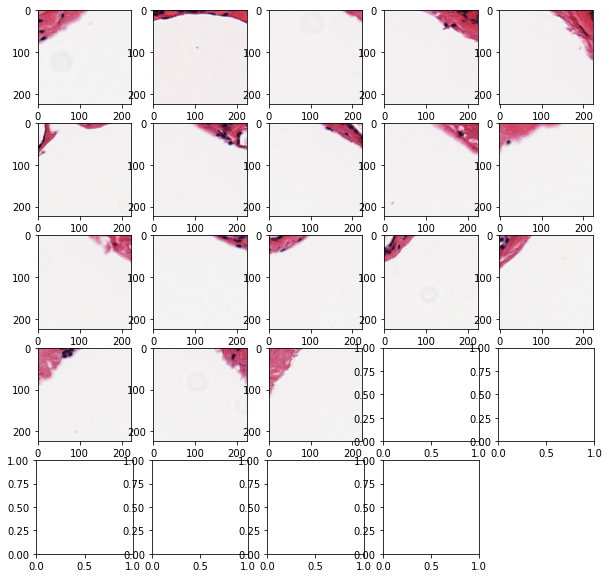

In [46]:
c = 0
for k in range(len(paths)//25 + 1):
    f, axarr = plt.subplots(5,5)
    f.set_size_inches(10,10)
    #plt.axis('off') check 
    for y in range(5): 
        for x in range(5):
            if c < len(paths):
                axarr[y,x].imshow(plt.imread(paths[c]))
                c += 1